In [1]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download -d puneet6060/intel-image-classification

intel-image-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!unzip intel-image-classification.zip

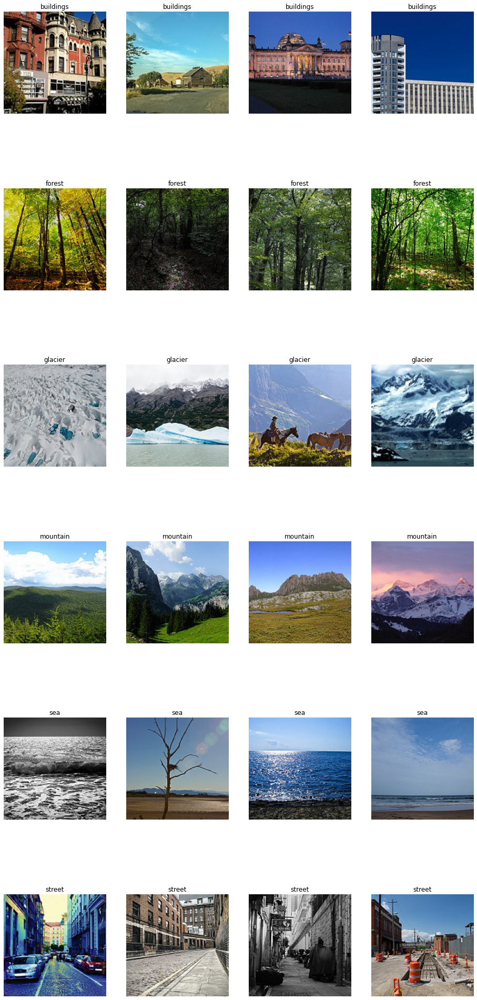

In [ ]:
classes=['buildings', 'forest' , 'glacier' , 'mountain', 'sea', 'street']
#Displaying theImages
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

#We'll output images in a 6X4 configuration. 

nrows=6
ncols=4

pic_index=0

fig=plt.gcf()
fig.set_size_inches(ncols*4,nrows*6)

pic_index+=4

next_a_pix = [os.path.join('./seg_train/seg_train/'+classes[0]+'/' ,fname) for fname in os.listdir('./seg_train/seg_train/'+classes[0]+'/')[pic_index-4:pic_index]]
next_b_pix = [os.path.join('./seg_train/seg_train/'+classes[1]+'/' ,fname) for fname in os.listdir('./seg_train/seg_train/'+classes[1]+'/')[pic_index-4:pic_index]]
next_c_pix = [os.path.join('./seg_train/seg_train/'+classes[2]+'/' ,fname) for fname in os.listdir('./seg_train/seg_train/'+classes[2]+'/')[pic_index-4:pic_index]]
next_d_pix = [os.path.join('./seg_train/seg_train/'+classes[3]+'/' ,fname) for fname in os.listdir('./seg_train/seg_train/'+classes[3]+'/')[pic_index-4:pic_index]]
next_e_pix = [os.path.join('./seg_train/seg_train/'+classes[4]+'/' ,fname) for fname in os.listdir('./seg_train/seg_train/'+classes[4]+'/')[pic_index-4:pic_index]]
next_f_pix = [os.path.join('./seg_train/seg_train/'+classes[5]+'/' ,fname) for fname in os.listdir('./seg_train/seg_train/'+classes[5]+'/')[pic_index-4:pic_index]]

j=0
for i, img_path in enumerate(next_a_pix+next_b_pix+next_c_pix+next_d_pix+next_e_pix+next_f_pix):
  sp=plt.subplot(nrows,ncols,i+1)
  sp.axis('Off')
  img=mpimg.imread(img_path)
  plt.imshow(img)

  if i%4==0 and i>=4:
    j=j+1
  sp.title.set_text(classes[j])

  
plt.show()
     

In [4]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import torch
import time
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
import torchvision
from collections import OrderedDict
from torch.autograd import Variable
from PIL import Image
from torch.optim import lr_scheduler
import copy
import json
import os
from os.path import exists
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

CUDA is available!  Training on GPU ...
cuda:0


In [5]:
!cp -r ./seg_train/seg_train .
!cp -r ./seg_test/seg_test .
!rm -r ./seg_train/seg_train
!rm -r ./seg_test/seg_test

cp: cannot stat './seg_train/seg_train': No such file or directory
cp: cannot stat './seg_test/seg_test': No such file or directory
rm: cannot remove './seg_train/seg_train': No such file or directory
rm: cannot remove './seg_test/seg_test': No such file or directory


## Data loeaders

In [6]:
batch_size = 32

data_transforms = {
    'seg_train': transforms.Compose([
        transforms.RandomRotation(30),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'seg_test': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}


data_dir ="."
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['seg_train', 'seg_test']}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=batch_size,
                                             shuffle=True, num_workers=4)
              for x in ['seg_train', 'seg_test']}

dataset_sizes = {x: len(image_datasets[x]) for x in ['seg_train', 'seg_test']}

class_names = image_datasets['seg_train'].classes

/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [7]:
image_datasets['seg_train'].classes

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

## resnet from scratch (baseline)

In [8]:
model = models.resnet50(pretrained=False)

print(model)


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [10]:
## add desired final layer to resnet architecture
from collections import OrderedDict

classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 512)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(512, 6)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))
model.fc = classifier

In [11]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=20):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(1, num_epochs+1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)
        
        for phase in ['seg_train', 'seg_test']:
            if phase == 'seg_train':
                scheduler.step()
                model.train()  
            else:
                model.eval()  

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'seg_train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'seg_train':
                        loss.backward()
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            if phase == 'seg_test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best valid accuracy: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [12]:
use_gpu = torch.cuda.is_available()

In [13]:
num_epochs = 40
if use_gpu:
    print ("Using GPU: "+ str(use_gpu))
    model = model.cuda()
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)
# A simple scheduler to decay learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

model_ft = train_model(model, criterion, optimizer, exp_lr_scheduler, num_epochs=num_epochs)

Using GPU: True
Epoch 1/40
----------


/usr/local/lib/python3.8/dist-packages/torch/optim/lr_scheduler.py:138: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


seg_train Loss: 1.7287 Acc: 0.2402
seg_test Loss: 1.6838 Acc: 0.2617

Epoch 2/40
----------
seg_train Loss: 1.6844 Acc: 0.2482
seg_test Loss: 1.6142 Acc: 0.2983

Epoch 3/40
----------
seg_train Loss: 1.6432 Acc: 0.2760
seg_test Loss: 1.5513 Acc: 0.3273

Epoch 4/40
----------
seg_train Loss: 1.5678 Acc: 0.3175
seg_test Loss: 1.4824 Acc: 0.3567

Epoch 5/40
----------
seg_train Loss: 1.5156 Acc: 0.3415
seg_test Loss: 1.4642 Acc: 0.3737

Epoch 6/40
----------
seg_train Loss: 1.5013 Acc: 0.3459
seg_test Loss: 1.4652 Acc: 0.3623

Epoch 7/40
----------
seg_train Loss: 1.4991 Acc: 0.3465
seg_test Loss: 1.4588 Acc: 0.3870

Epoch 8/40
----------
seg_train Loss: 1.5022 Acc: 0.3509
seg_test Loss: 1.4564 Acc: 0.3783

Epoch 9/40
----------
seg_train Loss: 1.5010 Acc: 0.3450
seg_test Loss: 1.4451 Acc: 0.3750

Epoch 10/40
----------
seg_train Loss: 1.4936 Acc: 0.3487
seg_test Loss: 1.4488 Acc: 0.3783

Epoch 11/40
----------
seg_train Loss: 1.4854 Acc: 0.3551
seg_test Loss: 1.4419 Acc: 0.3817

Epoch 12

KeyboardInterrupt: ignored

In [14]:
correct = 0
total = 0
predicts = list()
all_labels = list()
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        predicts.extend(predicted)
        all_labels.extend(labels)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 37 %


In [17]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}

# again no gradients needed
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: buildings is 9.8 %
Accuracy for class: forest is 65.6 %
Accuracy for class: glacier is 21.5 %
Accuracy for class: mountain is 74.1 %
Accuracy for class: sea   is 0.0 %
Accuracy for class: street is 56.1 %


## ResNet152

In [ ]:
model = models.resnet152(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

print(model)


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
## add desired final layer to resnet architecture
from collections import OrderedDict

classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 512)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(512, 6)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))
model.fc = classifier

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=20):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(1, num_epochs+1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)
        
        for phase in ['seg_train', 'seg_test']:
            if phase == 'seg_train':
                scheduler.step()
                model.train()  
            else:
                model.eval()  

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'seg_train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'seg_train':
                        loss.backward()
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            if phase == 'seg_test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best valid accuracy: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
use_gpu = torch.cuda.is_available()

In [ ]:
num_epochs = 15
if use_gpu:
    print ("Using GPU: "+ str(use_gpu))
    model = model.cuda()
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)
# A simple scheduler to decay learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

model_ft = train_model(model, criterion, optimizer, exp_lr_scheduler, num_epochs=num_epochs)

Using GPU: True
Epoch 1/15
----------


/usr/local/lib/python3.8/dist-packages/torch/optim/lr_scheduler.py:138: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


seg_train Loss: 0.6195 Acc: 0.7671
seg_test Loss: 0.3121 Acc: 0.8813

Epoch 2/15
----------
seg_train Loss: 0.5301 Acc: 0.7992
seg_test Loss: 0.2994 Acc: 0.8867

Epoch 3/15
----------
seg_train Loss: 0.4883 Acc: 0.8211
seg_test Loss: 0.3131 Acc: 0.8783

Epoch 4/15
----------
seg_train Loss: 0.4695 Acc: 0.8211
seg_test Loss: 0.3048 Acc: 0.8863

Epoch 5/15
----------
seg_train Loss: 0.4219 Acc: 0.8398
seg_test Loss: 0.2567 Acc: 0.9010

Epoch 6/15
----------
seg_train Loss: 0.4194 Acc: 0.8432
seg_test Loss: 0.2595 Acc: 0.9017

Epoch 7/15
----------
seg_train Loss: 0.4098 Acc: 0.8457
seg_test Loss: 0.2561 Acc: 0.9007

Epoch 8/15
----------
seg_train Loss: 0.4082 Acc: 0.8482
seg_test Loss: 0.2544 Acc: 0.9017

Epoch 9/15
----------
seg_train Loss: 0.4092 Acc: 0.8457
seg_test Loss: 0.2570 Acc: 0.9027

Epoch 10/15
----------
seg_train Loss: 0.4062 Acc: 0.8485
seg_test Loss: 0.2518 Acc: 0.9013

Epoch 11/15
----------
seg_train Loss: 0.4038 Acc: 0.8469
seg_test Loss: 0.2491 Acc: 0.9030

Epoch 12

In [ ]:
correct = 0
total = 0
predicts = list()
all_labels = list()
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        predicts.extend(predicted)
        all_labels.extend(labels)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 90 %


In [ ]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}

# again no gradients needed
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: buildings is 92.9 %
Accuracy for class: forest is 99.6 %
Accuracy for class: glacier is 83.5 %
Accuracy for class: mountain is 85.3 %
Accuracy for class: sea   is 94.7 %
Accuracy for class: street is 89.6 %


In [ ]:
predicts = [i.item() for i in predicts]
all_labels = [i.item() for i in all_labels]

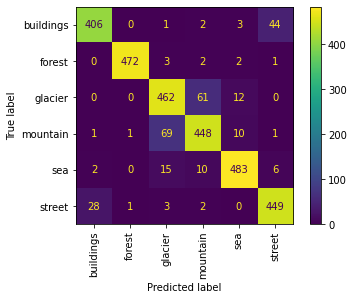

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(predicts, all_labels)

ConfusionMatrixDisplay.from_predictions(predicts, all_labels, display_labels=classes, xticks_rotation='vertical')

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
    
print(classification_report(predicts, all_labels, target_names=list(classes)))

              precision    recall  f1-score   support

   buildings       0.93      0.89      0.91       456
      forest       1.00      0.98      0.99       480
     glacier       0.84      0.86      0.85       535
    mountain       0.85      0.85      0.85       530
         sea       0.95      0.94      0.94       516
      street       0.90      0.93      0.91       483

    accuracy                           0.91      3000
   macro avg       0.91      0.91      0.91      3000
weighted avg       0.91      0.91      0.91      3000



## resnext model

In [ ]:
model = models.resnext101_64x4d(pretrained=True)

for param in model.parameters():
    param.requires_grad = False

print(model)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_64X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_64X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext101_64x4d-173b62eb.pth" to /root/.cache/torch/hub/checkpoints/resnext101_64x4d-173b62eb.pth


  0%|          | 0.00/319M [00:00<?, ?B/s]

Streaming output truncated to the last 5000 lines.
    )
    (20): Bottleneck(
      (conv1): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
      (bn2): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
    )
    (21): Bottleneck(
      (conv1): Conv2d(1024, 1024, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64, bias=False)
      (bn2): BatchNor

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
## add desired final layer to resnext architecture
from collections import OrderedDict

classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 512)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(512, 6)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))
model.fc = classifier

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=20):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(1, num_epochs+1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)
        
        for phase in ['seg_train', 'seg_test']:
            if phase == 'seg_train':
                scheduler.step()
                model.train()  
            else:
                model.eval()  

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'seg_train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'seg_train':
                        loss.backward()
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            if phase == 'seg_test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best valid accuracy: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
use_gpu = torch.cuda.is_available()

In [ ]:
num_epochs = 15
if use_gpu:
    print ("Using GPU: "+ str(use_gpu))
    model = model.cuda()
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)
# A simple scheduler to decay learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

model_ft = train_model(model, criterion, optimizer, exp_lr_scheduler, num_epochs=num_epochs)

Using GPU: True
Epoch 1/15
----------


/usr/local/lib/python3.8/dist-packages/torch/optim/lr_scheduler.py:138: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "


seg_train Loss: 0.6038 Acc: 0.7821
seg_test Loss: 0.3024 Acc: 0.8947

Epoch 2/15
----------
seg_train Loss: 0.5000 Acc: 0.8139
seg_test Loss: 0.2806 Acc: 0.9000

Epoch 3/15
----------
seg_train Loss: 0.4619 Acc: 0.8267
seg_test Loss: 0.2838 Acc: 0.8983

Epoch 4/15
----------
seg_train Loss: 0.4503 Acc: 0.8301
seg_test Loss: 0.2808 Acc: 0.8967

Epoch 5/15
----------
seg_train Loss: 0.4355 Acc: 0.8361
seg_test Loss: 0.2624 Acc: 0.9073

Epoch 6/15
----------
seg_train Loss: 0.4219 Acc: 0.8386
seg_test Loss: 0.2616 Acc: 0.9060

Epoch 7/15
----------
seg_train Loss: 0.4146 Acc: 0.8426
seg_test Loss: 0.2612 Acc: 0.9043

Epoch 8/15
----------
seg_train Loss: 0.4122 Acc: 0.8465
seg_test Loss: 0.2611 Acc: 0.9063

Epoch 9/15
----------
seg_train Loss: 0.4179 Acc: 0.8416
seg_test Loss: 0.2600 Acc: 0.9040

Epoch 10/15
----------
seg_train Loss: 0.4129 Acc: 0.8460
seg_test Loss: 0.2593 Acc: 0.9043

Epoch 11/15
----------
seg_train Loss: 0.4030 Acc: 0.8501
seg_test Loss: 0.2615 Acc: 0.9033

Epoch 12

In [ ]:
correct = 0
total = 0
predicts = list()
all_labels = list()
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        predicts.extend(predicted)
        all_labels.extend(labels)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 90 %


In [ ]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}

# again no gradients needed
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: buildings is 90.2 %
Accuracy for class: forest is 99.4 %
Accuracy for class: glacier is 83.7 %
Accuracy for class: mountain is 86.1 %
Accuracy for class: sea   is 94.7 %
Accuracy for class: street is 91.6 %


## WideResnet

In [ ]:
model = models.wide_resnet101_2(pretrained=True)
for param in model.parameters():
    param.requires_grad = False

print(model)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Wide_ResNet101_2_Weights.IMAGENET1K_V1`. You can also use `weights=Wide_ResNet101_2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/wide_resnet101_2-32ee1156.pth" to /root/.cache/torch/hub/checkpoints/wide_resnet101_2-32ee1156.pth


  0%|          | 0.00/243M [00:00<?, ?B/s]

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), strid

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
from collections import OrderedDict

## add desired final layer to wideresnet architecture
classifier = nn.Sequential(OrderedDict([
                          ('fc1', nn.Linear(2048, 512)),
                          ('relu', nn.ReLU()),
                          ('fc2', nn.Linear(512, 6)),
                          ('output', nn.LogSoftmax(dim=1))
                          ]))
model.fc = classifier

In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=20):
    since = time.time()
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(1, num_epochs+1):
        print('Epoch {}/{}'.format(epoch, num_epochs))
        print('-' * 10)
        
        for phase in ['seg_train', 'seg_test']:
            if phase == 'seg_train':
                scheduler.step()
                model.train()  
            else:
                model.eval()  

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs, labels = inputs.to(device), labels.to(device)
                optimizer.zero_grad()
                with torch.set_grad_enabled(phase == 'seg_train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    _, preds = torch.max(outputs, 1)
                    if phase == 'seg_train':
                        loss.backward()
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            if phase == 'seg_test' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best valid accuracy: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
use_gpu = torch.cuda.is_available()

In [ ]:
num_epochs = 15
if use_gpu:
    print ("Using GPU: "+ str(use_gpu))
    model = model.cuda()
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.001)
# A simple scheduler to decay learning rate
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

model_ft = train_model(model, criterion, optimizer, exp_lr_scheduler, num_epochs=num_epochs)

Using GPU: True
Epoch 1/15
----------


/usr/local/lib/python3.8/dist-packages/torch/optim/lr_scheduler.py:138: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn("Detected call of `lr_scheduler.step()` before `optimizer.step()`. "
/usr/local/lib/python3.8/dist-packages/torch/utils/data/dataloader.py:554: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(

seg_train Loss: 0.6659 Acc: 0.7509
seg_test Loss: 0.4104 Acc: 0.8507

Epoch 2/15
----------
seg_train Loss: 0.5795 Acc: 0.7815
seg_test Loss: 0.3224 Acc: 0.8837

Epoch 3/15
----------
seg_train Loss: 0.5366 Acc: 0.7988
seg_test Loss: 0.3044 Acc: 0.8877

Epoch 4/15
----------
seg_train Loss: 0.5502 Acc: 0.7943
seg_test Loss: 0.3083 Acc: 0.8820

Epoch 5/15
----------
seg_train Loss: 0.4737 Acc: 0.8239
seg_test Loss: 0.2913 Acc: 0.8947

Epoch 6/15
----------
seg_train Loss: 0.4609 Acc: 0.8286
seg_test Loss: 0.2915 Acc: 0.8910

Epoch 7/15
----------
seg_train Loss: 0.4636 Acc: 0.8246
seg_test Loss: 0.2852 Acc: 0.8967

Epoch 8/15
----------
seg_train Loss: 0.4676 Acc: 0.8247
seg_test Loss: 0.2915 Acc: 0.8943

Epoch 9/15
----------
seg_train Loss: 0.4538 Acc: 0.8316
seg_test Loss: 0.2829 Acc: 0.8983

Epoch 10/15
----------
seg_train Loss: 0.4644 Acc: 0.8264
seg_test Loss: 0.2874 Acc: 0.8967

Epoch 11/15
----------
seg_train Loss: 0.4536 Acc: 0.8286
seg_test Loss: 0.2808 Acc: 0.9023

Epoch 12

In [ ]:
correct = 0
total = 0
predicts = list()
all_labels = list()
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        predicts.extend(predicted)
        all_labels.extend(labels)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 90 %


In [ ]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}

# again no gradients needed
with torch.no_grad():
    for data in dataloaders['seg_test']:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: buildings is 87.6 %
Accuracy for class: forest is 99.4 %
Accuracy for class: glacier is 80.5 %
Accuracy for class: mountain is 85.9 %
Accuracy for class: sea   is 96.7 %
Accuracy for class: street is 92.6 %


## Inception V3

In [44]:
transform = transforms.Compose([
    transforms.Resize((300,300)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(0.3,0.4,0.4,0.2),
    transforms.ToTensor(),
    transforms.Normalize((0.425,0.415,0.405),(0.205,0.205,0.205))
])

# Augmentation on test images not needed
transform_tests = torchvision.transforms.Compose([
    transforms.Resize((300,300)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

train_data = datasets.ImageFolder(root='./seg_train',transform=transform)
test_data = datasets.ImageFolder(root='./seg_test',transform=transform_tests)

training_data = torch.utils.data.DataLoader(train_data,batch_size=32,drop_last=True,shuffle=True,num_workers=2)
validation_data = torch.utils.data.DataLoader(test_data, batch_size =32, drop_last=True,shuffle=True,num_workers=2)

In [45]:
model = models.inception_v3(pretrained=True)

for param in model.parameters():
        param.requires_grad = False
print(model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [46]:
model.avgpool = nn.AdaptiveAvgPool2d(output_size=(1,1))
model.fc = nn.Sequential(nn.Flatten(),
                            nn.Linear(2048,128),
                            nn.ReLU(),
                            nn.Dropout(0.2),
                            nn.Linear(128,6))
model.aux_logits = False
model.to(device)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [47]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr= 1e-3)

In [48]:
def train_batch(x, y, model, opt, loss_fn):
    output = model(x)
    batch_loss = loss_fn(output, y)
    batch_loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    return batch_loss.item()

@torch.no_grad()
def accuracy(x, y, model):
    model.eval()
    prediction = model(x)
    max_values, argmaxes = prediction.max(-1)
    is_correct = argmaxes == y
    return is_correct.cpu().numpy().tolist()

@torch.no_grad()
def val_loss(x, y, model):
    model.eval()
    prediction = model(x)
    val_loss = loss_fn(prediction, y)
    return val_loss.item()

In [49]:
best_model_wts = copy.deepcopy(model.state_dict())
best_acc = 0.0
since = time.time()

for epoch in range(10):
    print('Epoch {}/{}'.format(epoch, 10))
    print('-' * 10)

    train_epoch_losses, train_epoch_accuracies = [], []
    for ix, batch in enumerate(iter(training_data)):
        x, y = batch
        x, y= x.to(device), y.to(device)
        batch_loss = train_batch(x, y, model, optimizer, loss_fn)
        is_correct = accuracy(x, y, model)
        train_epoch_accuracies.extend(is_correct)
        train_epoch_losses.append(batch_loss)        
    train_epoch_loss = np.array(train_epoch_losses).mean()
    train_epoch_accuracy = np.mean(train_epoch_accuracies) 
    print('seg_train Loss: {:.4f} Acc: {:.4f}'.format(train_epoch_loss, train_epoch_accuracy))       
    
    for ix, batch in enumerate(iter(validation_data)):
        x, y = batch
        x, y= x.to(device), y.to(device)
        val_is_correct = accuracy(x, y, model)
        validation_loss = val_loss(x, y, model)    
        val_epoch_accuracy = np.mean(val_is_correct)
    if val_epoch_accuracy > best_acc:
        best_acc = val_epoch_accuracy
        best_model_wts = copy.deepcopy(model.state_dict())
    print('seg_test Loss: {:.4f} Acc: {:.4f}'.format(validation_loss, val_epoch_accuracy))
    
time_elapsed = time.time() - since
print('Training complete in {:.0f}m {:.0f}s'.format(
    time_elapsed // 60, time_elapsed % 60))
print('Best valid accuracy: {:4f}'.format(best_acc))
model.load_state_dict(best_model_wts)

Epoch 0/10
----------
seg_train Loss: 0.3076 Acc: 0.8989
seg_test Loss: 0.1594 Acc: 0.9375
Epoch 1/10
----------
seg_train Loss: 0.2215 Acc: 0.9221
seg_test Loss: 0.1917 Acc: 0.9062
Epoch 2/10
----------
seg_train Loss: 0.2062 Acc: 0.9281
seg_test Loss: 0.1397 Acc: 0.9688
Epoch 3/10
----------
seg_train Loss: 0.1847 Acc: 0.9361
seg_test Loss: 0.3535 Acc: 0.8125
Epoch 4/10
----------
seg_train Loss: 0.1777 Acc: 0.9381
seg_test Loss: 0.3165 Acc: 0.9062
Epoch 5/10
----------
seg_train Loss: 0.1687 Acc: 0.9411
seg_test Loss: 0.1529 Acc: 0.9688
Epoch 6/10
----------
seg_train Loss: 0.1500 Acc: 0.9478
seg_test Loss: 0.3460 Acc: 0.8438
Epoch 7/10
----------
seg_train Loss: 0.1522 Acc: 0.9488
seg_test Loss: 0.2637 Acc: 0.9062
Epoch 8/10
----------
seg_train Loss: 0.1401 Acc: 0.9512
seg_test Loss: 0.1442 Acc: 0.9688
Epoch 9/10
----------
seg_train Loss: 0.1367 Acc: 0.9531
seg_test Loss: 0.3236 Acc: 0.9062
Training complete in 32m 50s
Best valid accuracy: 0.968750


<All keys matched successfully>

In [50]:
correct = 0
total = 0
predicts = list()
all_labels = list()
# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in validation_data:
        images, labels = data[0].to(device), data[1].to(device)
        # calculate outputs by running images through the network
        outputs = model(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        predicts.extend(predicted)
        all_labels.extend(labels)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the test images: {100 * correct // total} %')

Accuracy of the network on the test images: 92 %


In [51]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}

# again no gradients needed
with torch.no_grad():
    for data in validation_data:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model(images)
        _, predictions = torch.max(outputs, 1)
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1


# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

Accuracy for class: buildings is 92.0 %
Accuracy for class: forest is 100.0 %
Accuracy for class: glacier is 84.5 %
Accuracy for class: mountain is 87.9 %
Accuracy for class: sea   is 96.4 %
Accuracy for class: street is 93.2 %


In [52]:
predicts = [i.item() for i in predicts]
all_labels = [i.item() for i in all_labels]

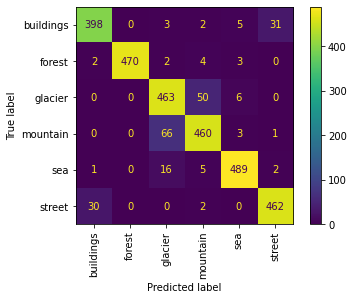

In [53]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(predicts, all_labels)

ConfusionMatrixDisplay.from_predictions(predicts, all_labels, display_labels=classes, xticks_rotation='vertical')

In [54]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
    
print(classification_report(predicts, all_labels, target_names=list(classes)))

              precision    recall  f1-score   support

   buildings       0.92      0.91      0.91       439
      forest       1.00      0.98      0.99       481
     glacier       0.84      0.89      0.87       519
    mountain       0.88      0.87      0.87       530
         sea       0.97      0.95      0.96       513
      street       0.93      0.94      0.93       494

    accuracy                           0.92      2976
   macro avg       0.92      0.92      0.92      2976
weighted avg       0.92      0.92      0.92      2976

